<a href="https://colab.research.google.com/github/JamilePolycarpo/MachineLearning-Printer3D-Failer/blob/main/FCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torchvision
import pandas as pd
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import json
from torchvision.transforms import functional as F
import cv2


In [ ]:
class SpaghettiDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation_file, transforms=None):
        self.root = root
        self.transforms = transforms
        with open(annotation_file) as f:
            self.annotations = json.load(f)
        self.image_info = {image['id']: image for image in self.annotations['images']}
        self.annotations_info = {image_id: [] for image_id in self.image_info.keys()}
        for ann in self.annotations['annotations']:
            self.annotations_info[ann['image_id']].append(ann)
        self.num_classes = max([ann['category_id'] for ann in self.annotations['annotations']])

    def __getitem__(self, idx):
        image_info = self.image_info[idx]
        img_path = os.path.join(self.root, image_info['file_name'])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = F.to_tensor(img)

        anns = self.annotations_info[image_info['id']]
        boxes = []
        labels = []
        for ann in anns:
            xmin = ann['bbox'][0]
            ymin = ann['bbox'][1]
            xmax = xmin + ann['bbox'][2]
            ymax = ymin + ann['bbox'][3]
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(ann.get('category_id', 0)-1)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(anns),), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.annotations['images'])

In [ ]:
train_dataset = SpaghettiDataset('./Spaghetti-3D-1/train', './Spaghetti-3D-1/train/_annotations.coco.json')
test_dataset = SpaghettiDataset('./Spaghetti-3D-1/test', './Spaghetti-3D-1/test/_annotations.coco.json')
val_dataset = SpaghettiDataset('./Spaghetti-3D-1/valid', './Spaghetti-3D-1/valid/_annotations.coco.json')

In [ ]:
data_loader_train = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
data_loader_test = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

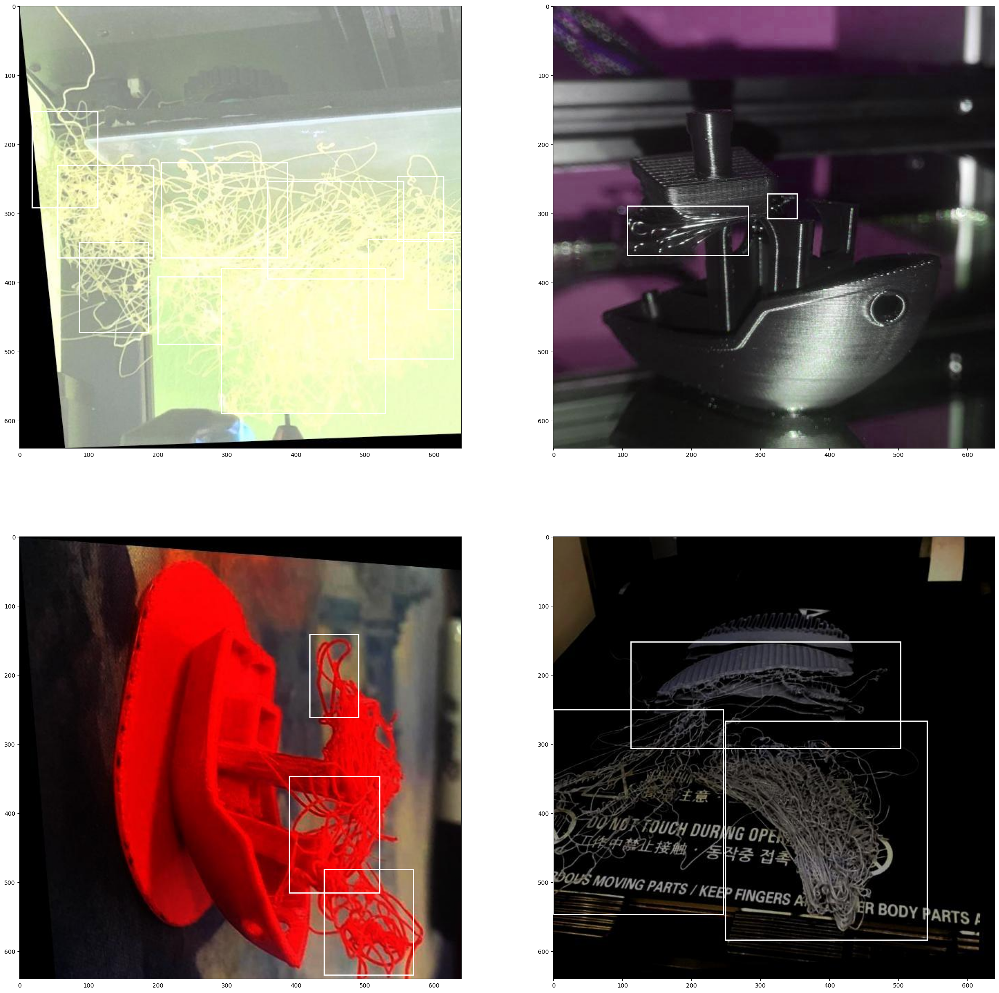

In [ ]:
images,labels=next(iter(data_loader_train))
from matplotlib import patches
def view(images,labels,k,std=1,mean=0):
    figure = plt.figure(figsize=(30,30))
    images=list(images)
    labels=list(labels)
    for i in range(k):
        out=torchvision.utils.make_grid(images[i])
        inp=out.cpu().numpy().transpose((1,2,0))
        inp=np.array(std)*inp+np.array(mean)
        inp=np.clip(inp,0,1)
        ax = figure.add_subplot(2,2, i + 1)
        ax.imshow(images[i].cpu().numpy().transpose((1,2,0)))
        l=labels[i]['boxes'].cpu().numpy()
        l[:,2]=l[:,2]-l[:,0]
        l[:,3]=l[:,3]-l[:,1]
        for j in range(len(l)):
            ax.add_patch(patches.Rectangle((l[j][0],l[j][1]),l[j][2],l[j][3],linewidth=2,edgecolor='w',facecolor='none'))

view(images,labels,4)

In [ ]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('using device:', device)
num_classes = 2  # 1 class (person) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features

model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model=model.to(device)


# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

/home/mattusi/anaconda3/envs/torchEnv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/mattusi/anaconda3/envs/torchEnv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


using device: cuda


In [ ]:
# For Training
images, targets = next(iter(data_loader_train))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
output = model(images, targets)  # Returns losses and detections
print(output)

{'loss_classifier': tensor(0.5619, device='cuda:0', grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0., device='cuda:0', grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.2217, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(0.0212, device='cuda:0', grad_fn=<DivBackward0>)}


In [ ]:
model.train()
num_epochs = 2
for epoch in range(num_epochs):
    print(f'Epoch {epoch}')
    for images,targets in data_loader_train:

        imagesDevice = list(image.to(device) for image in images)
        targetsDevice = [{k: v.to(device) for k, v in t.items()} for t in targets]
        model=model.float()
        loss_dict = model(imagesDevice, targetsDevice)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print("Loss = {:.4f} ".format(losses.item()))

torch.save(model.state_dict(), './model.pth')

Epoch 0
Loss = 0.0865 
Epoch 1
Loss = 0.0513 


In [ ]:
model.load_state_dict(torch.load('./model.pth'))

<All keys matched successfully>

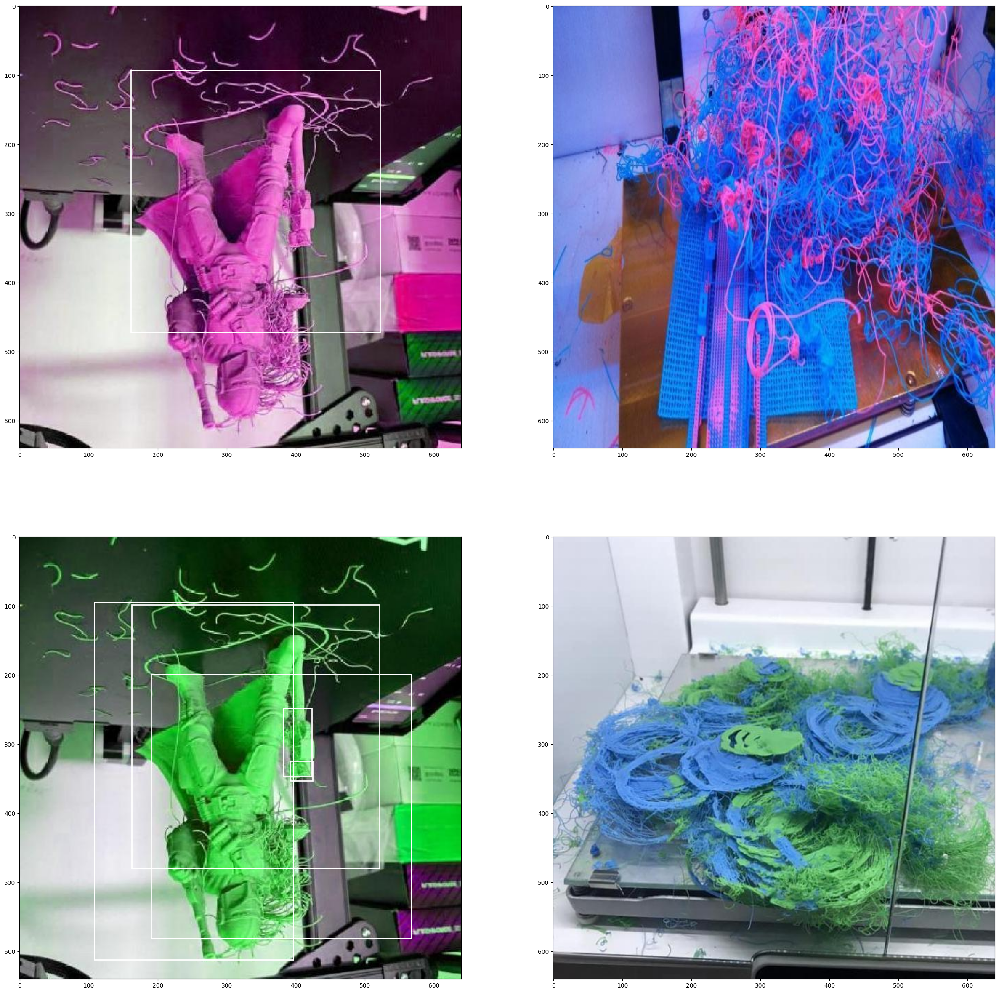

In [ ]:
images,targets=next(iter(data_loader_test))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

model.eval()
output=model(images)

with torch.no_grad():
    view(images,output,4)